# AUDIO REVERB NOTEBOOK

Le but de ce notebook est de réaliser des filtres audios réverbératifs à l'aide du langage de programmation Python et en s'aidant de l'article scientifique "Natural Sounding Artificial Reverberation" de Mr R.SCHROEDER.

La réverbération est un effet acoustique qu'une pièce ou un espace a sur un son où le son que nous percevons est un mélange du son direct et des échos denses de ce son réfléchi par les murs et les objets dans l'espace qui se chevauchent.

Pour réaliser ce notebook on importe tout d'abord toutes les bibliothèques de fonction qui vont nous permettre de produire des données numériques, des graphiques, des sons. Il faut pouvoir en effet entendre le résultat de nos traitements effectués

In [1]:
%matplotlib notebook
from matplotlib.pyplot import *
from numpy import *
from audio.coders import *
from bitstream import *
from IPython.display import *
import audio.wave as wave

import scipy.io
from scipy.signal import lfilter

En premier lieu, nous chargons un son importé dont nous visualisons le spectre à l'aide de la fonction wave.read. Nous tâchons pour tout le reste de l'exercice de garder une fréquence d'échantillonnage de 44100 Hz. La fonction Audio permet alors d'écouter ce son sur le notebook

In [2]:
N=441000
df = 44100
dt = 1.0 / df
t = r_[0:N] * dt
f= 440

<IPython.core.display.Javascript object>


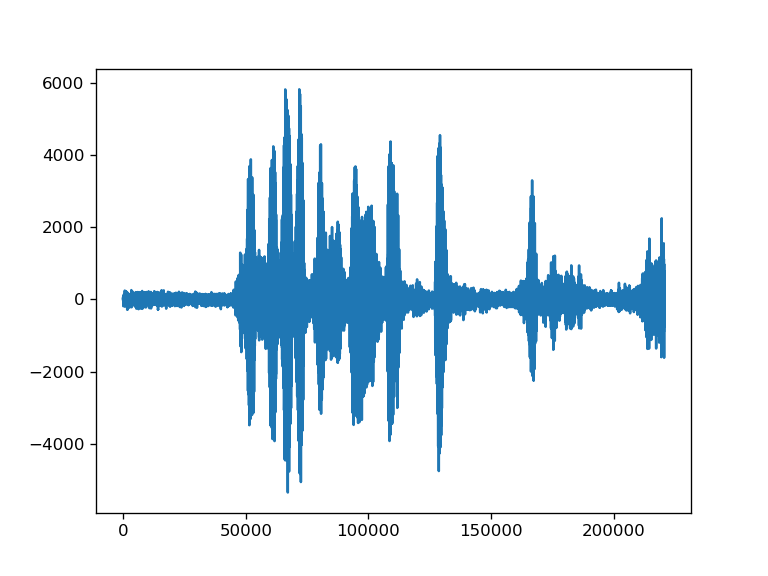

In [3]:
data1=wave.read("JC.wav",scale=False)[0]
figure()
plot(data1)

display(Audio("JC.wav"))

A l'aide de la transformée de Fourier du signal, nous accédons ensuite aux différentes composantes spectrales du signal.

<IPython.core.display.Javascript object>


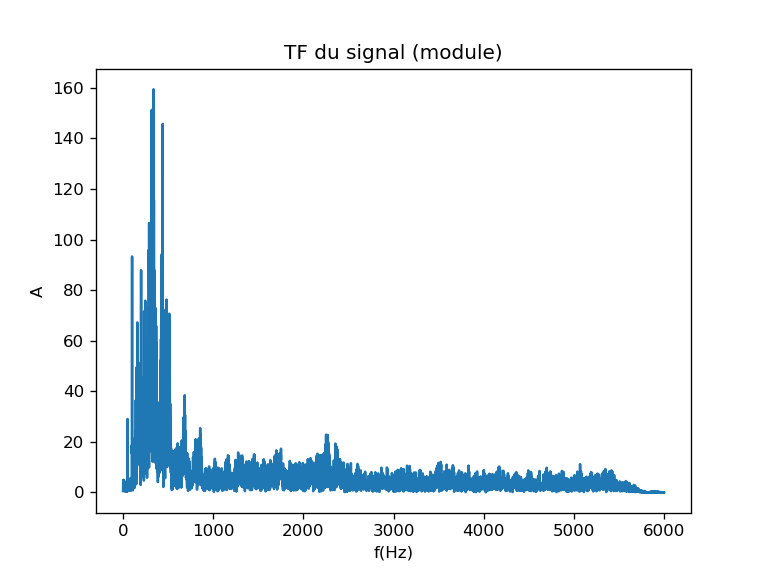

Text(0,0.5,'A')

In [4]:
from audio.fourier import F

Fx = F(data1, dt=dt, power_of_two=True)
f2=arange(0, 6000)
figure()
plot(f2, abs(Fx(f2)))
title('TF du signal (module)')
xlabel("f(Hz)")
ylabel("A")

Le premier des traitements qu'on peut appliquer à notre signal d'entrée pour appréhender la réverbération est celui d'un unique écho. L'écho se caractérise dans le domaine temporel par une impulsion identique au signal d'origine ou atténuée mais décalée dans le temps d'un retard tau. 

La méthode employée pour tous les filtres de ce notebook est la suivante : on calcule la fonction de transfert H(f) spectrale du filtre à laquelle on applique une transformée de Fourier inverse pour avoir sa réponse impulsionnelle. On convolue ensuite la réponse impulsionnelle au signal d'entrée pour obtenir le signal filtré.

<IPython.core.display.Javascript object>


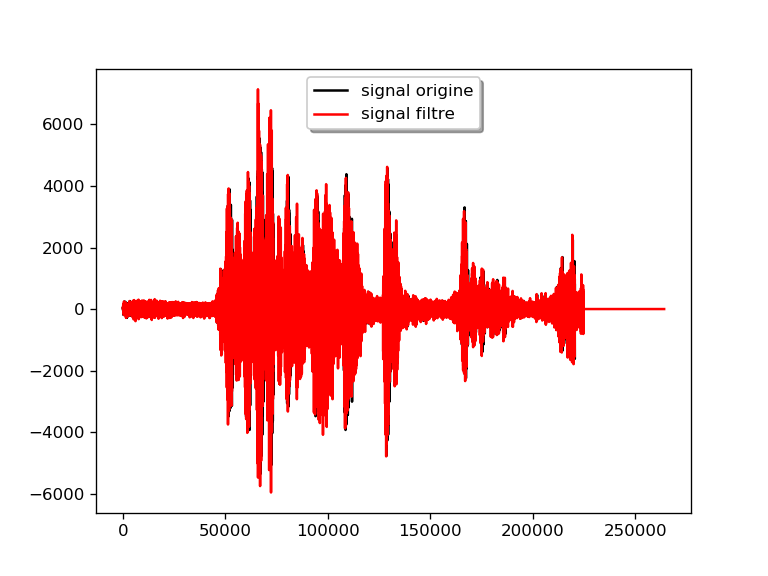

/srv/conda/envs/kernel/lib/python2.7/site-packages/numpy/core/numeric.py:501: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [5]:
import matplotlib.pyplot as plt
from __future__ import division

JC=wave.read("JC.wav", scale=False)[0]
fs = df  # fréquence d'échantillonnage
T = 1/fs    # Période
tau = 0.1 # Retard    
n=511
a=0.5 #facteur d'atténuation

def freverb0(tau1,fs1,a1): #Fonction de transfert du filtre écho unique
    freqs = np.arange(0, fs1)
    fonction = 1 + (a1*exp(-1j*2*pi*freqs*tau1))
    return fonction

fonction0= freverb0(tau,fs,a)
inv0= fft.ifft(fonction0)
conv0 =  convolve(inv0,JC)
conv0 = conv0[n//2:-(n//2)]

plt.figure()
plt.plot(JC,'k')
plt.plot(conv0,'r')
plt.legend(('signal origine','signal filtre'),loc='upper center', shadow=True)

In [6]:
display(Audio("JC.wav"))
wave.write(conv0, "conv0.wav", df=df)
display(Audio("conv0.wav"))

/srv/conda/envs/kernel/lib/python2.7/site-packages/audio/wave.py:178: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.round(data).astype(np.int16)


L'écho s'entend parfaitement avec cette première fonction de transfert. On va maintenant produire à l'aide d'une boucle plusieurs échos à la même fréquence avec un gain g nécessairement inférieur à 1 pour que le filtre soit stable. Sa réponse impulsionnelle est maintenant un écho répété et décroissant de manière exponentielle.

<IPython.core.display.Javascript object>


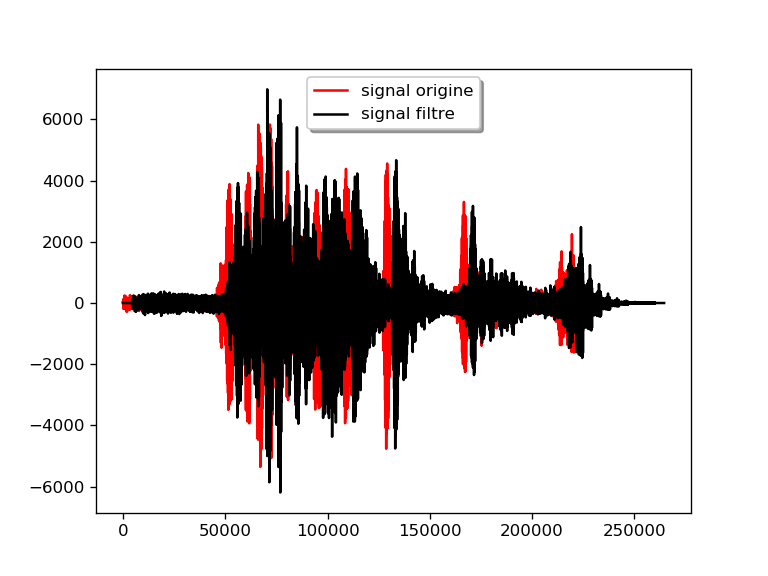

In [7]:
import matplotlib.pyplot as plt
from __future__ import division

fs = df  # Fréquence d'échantillonnage
T = 1/fs    # Période
tau = 0.1 # Retard 
g=0.5 #Gain


def freverb1(tau1,fs1,g1,scale): #Fonction de transfert du premier filtre reverb
    freqs = np.arange(0, fs1,scale)
    fonction = exp(-1j*2*pi*freqs*tau1)/(1-g1*exp(-1j*2*pi*freqs*tau1))
    return fonction


fonction1= freverb1(tau,fs,g,1)
inv1= fft.ifft(fonction1) #Réponse impulsionnelle
conv1 =  convolve(inv1,JC)


plt.figure()
plt.plot(JC,'r')
plt.plot(conv1,'k')
plt.legend(('signal origine','signal filtre'),loc='upper center', shadow=True)



In [8]:
display(Audio("JC.wav"))
wave.write(conv1, "conv1.wav", df=df)
display(Audio("conv1.wav"))

<IPython.core.display.Javascript object>


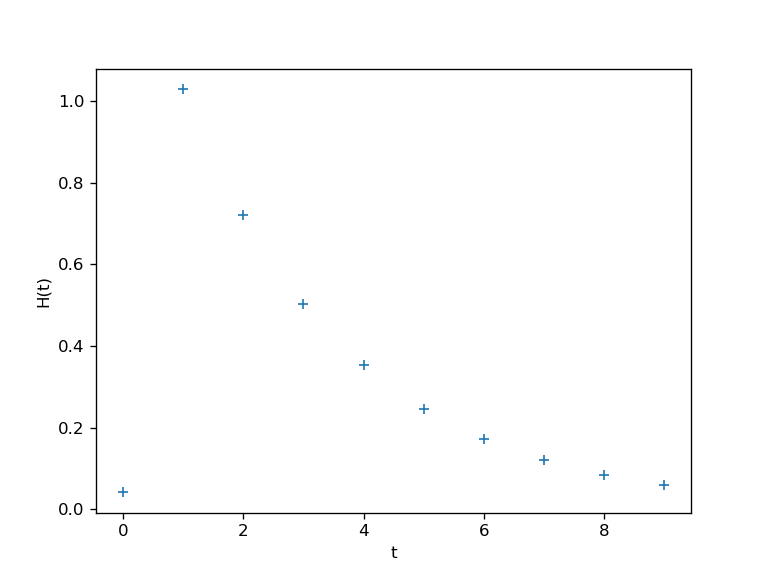

Text(0.5,0,'t')

In [9]:
invv1= fft.ifft(freverb1(1,1,0.7,1/10))

plt.figure()
plt.plot(abs(real(invv1)),"+")
plt.ylabel('H(t)')
plt.xlabel('t')

<IPython.core.display.Javascript object>


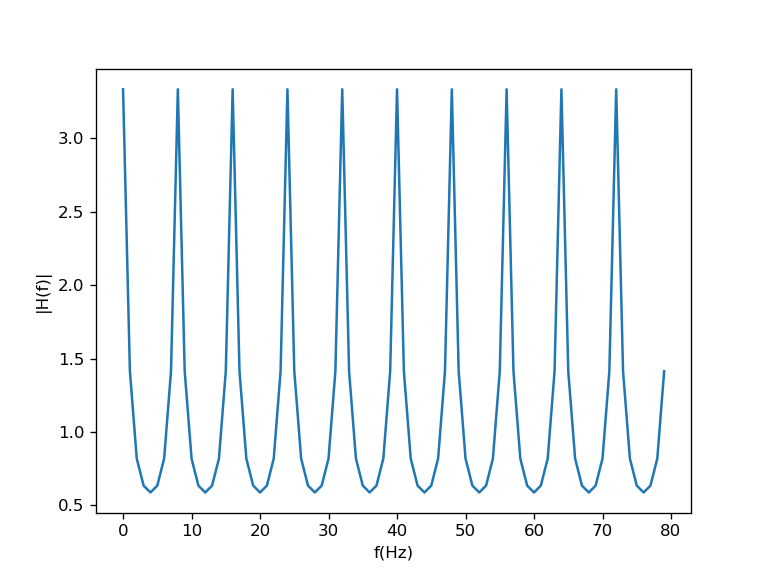

Text(0.5,0,'f(Hz)')

In [10]:
import matplotlib.pyplot as plt
from __future__ import division
plt.figure()
plt.plot(abs(freverb1(1,10,0.7,1/8))) # Amplitude spectrale du train d'échos
plt.ylabel('|H(f)|')
plt.xlabel('f(Hz)')

Comme on peut l'observer, l'amplitude en fréquence du train d'écho oscille entre un maximum 1/(1-g) pour f=n/tau et un minimum 1/(1+g) en f=n/tau + 1/(2*pi*tau). Ce sont ces pics et ces creux qui donnent malheureusement un son mal réverbéré. La forme de la fonction H(f) en forme de peigne donne son nom à ce filtre : "comb filter". 

Dans l'article, une autre fonction de transfert est alors présenté permettant de faire passer toutes les fréquences avec le même gain, autrement H(f)=1 quelque soit f. Il est logiquement appelé "all-pass filter".

<IPython.core.display.Javascript object>


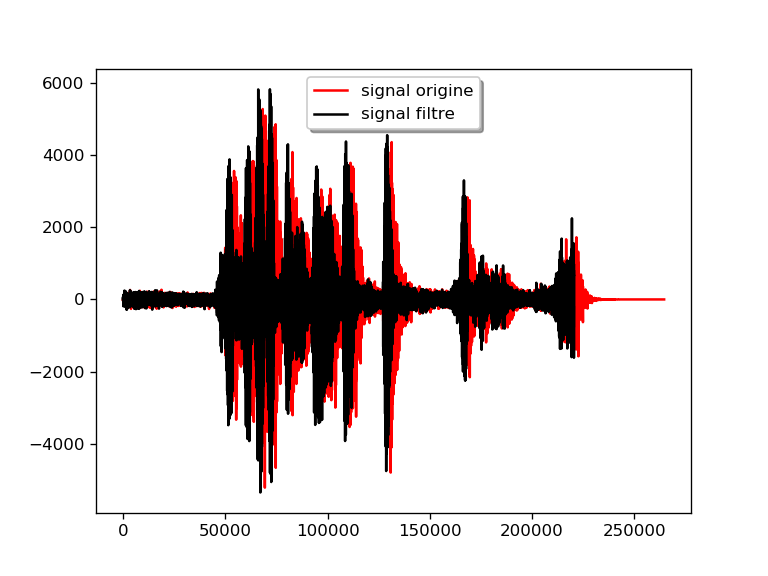

<IPython.core.display.Javascript object>


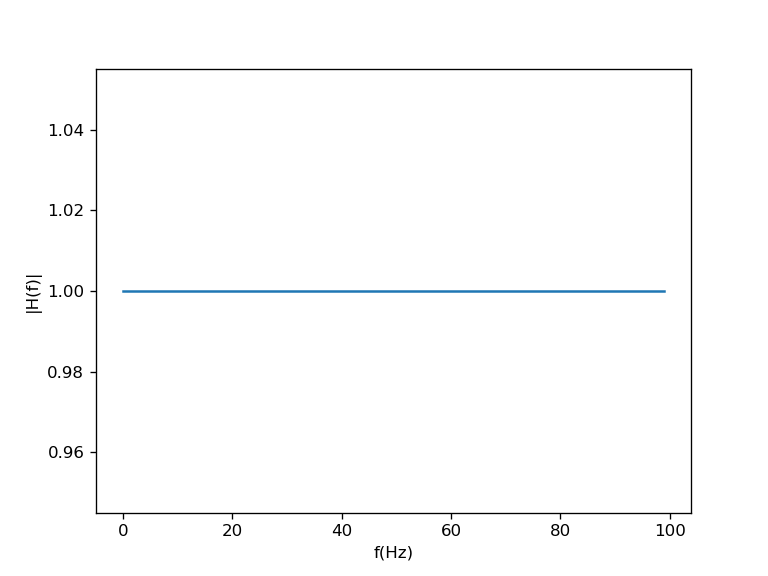

Text(0.5,0,'f(Hz)')

In [11]:
import matplotlib.pyplot as plt
from __future__ import division

fs = df  # Sample rate
T = 1/fs    # Sample period
tau = 0.05 # Delay    
g=0.4

def freverb2(tau1,fs1,g1,scale): #Fonction de transfert du deuxième filtre reverb
    freqs = np.arange(0, fs1,scale)
    fonctionn = exp(-1j*2*pi*freqs*tau1)*((1-g1*exp(1j*2*pi*freqs*tau1))/(1-g1*exp(-1j*2*pi*freqs*tau1)))
    return fonctionn


fonction2 = freverb2(tau,fs,g,1)
inv2= fft.ifft(fonction2)
conv2 =  convolve(inv2,JC)


plt.figure()
plt.plot(conv2,'r')
plt.plot(JC,'k')
plt.legend(('signal origine','signal filtre'),loc='upper center', shadow=True)
plt.figure()
plot(abs(freverb2(2,10,0.7,0.1)))
plt.ylabel('|H(f)|')
plt.xlabel('f(Hz)')

<IPython.core.display.Javascript object>


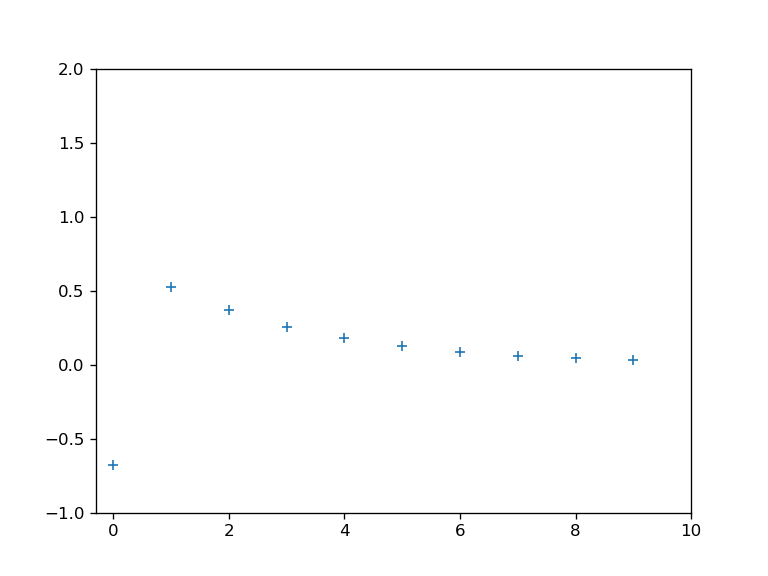

(-1, 2)

In [12]:
import matplotlib.pyplot as plt
from __future__ import division

invv= fft.ifft(freverb2(1,1,0.7,1/10))
plt.figure()
plt.plot(invv,"+")
xlim([-0.3,10])
ylim([-1,2])

In [13]:
display(Audio("JC.wav"))
wave.write(conv2, "conv2.wav", df=df)
display(Audio("conv2.wav"))

In [54]:
def all_pass_filter(signal,delay,g):
    freqs = np.arange(0, fs)
#e = np.exp(-1.j*freqs*2*np.pi*tau)
#f2 = r_[0.0:df/2.0:df/2.0/2**10]
    fonction3 = exp(-1j*2*pi*freqs*delay)*((1-g*exp(1j*2*pi*freqs*delay))/(1-g*exp(-1j*2*pi*freqs*delay)))
    inv= fft.ifft(fonction3)
    return convolve(inv,signal)

In [55]:
def comb_filter(signal,delay,g):
    freqs = np.arange(0, fs)
    fonction = fonction = exp(-1j*2*pi*freqs*delay)/(1-g*exp(-1j*2*pi*freqs*delay))
    inv= fft.ifft(fonction)
    return convolve(inv,signal)

In [56]:
p1=comb_filter(JC,0.1,0.1)
p2=comb_filter(JC,0.05,0.1)
p3=comb_filter(JC,0.5,0.1)
p4=comb_filter(JC,0.2,0.1)

In [57]:
JC=JC[0:220000]
p11=p1[0:220000]
p21=p2[0:220000]
p31=p3[0:220000]
p41=p4[0:220000]
JC1= JC+p11+p21+p31+p41
wave.write(JC1,"JC1.wav")
display(Audio("JC.wav"))
display(Audio("JC1.wav"))

In [58]:
p6=all_pass_filter(JC1,0.3,0.1)
p7=all_pass_filter(p6,0.2,0.1)
wave.write(p7,"p7.wav")
display(Audio("JC.wav"))
display(Audio("p7.wav"))

<IPython.core.display.Javascript object>


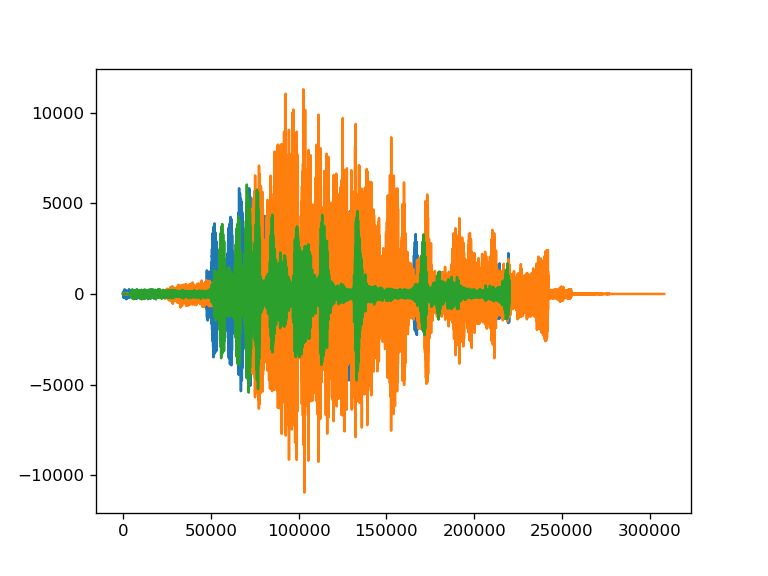

In [59]:
figure()
plt.plot(JC)
plt.plot(p7)
plt.plot(p11)